In [1]:
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
import palantir
import scanpy as sc
import scvelo as scv
import cellrank as cr
import scvi
import phate
import plotly.express as px
import numpy as np
from dash import Dash, dcc, html, Input, Output
scvi.settings.seed = 1995

import pandas as pd

import os
import sys
os.environ['R_HOME'] = sys.exec_prefix+"/lib/R/"

# Plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl

from copy import copy
reds = copy(mpl.cm.Reds)
reds.set_under("lightgray")

def matplotlib_to_plotly(cmap, pl_entries):
    h = 1.0/(pl_entries-1)
    pl_colorscale = []

    for k in range(pl_entries):
        C = list(map(np.uint8, np.array(cmap(k * h)[:3]) * 255))
        pl_colorscale.append([k*h, 'rgb'+str((C[0], C[1], C[2]))])

    return pl_colorscale

plotly_reds = matplotlib_to_plotly(reds, 255)
plotly_reds[0] = [0.0, 'rgb(211, 211, 211)']
sc.set_figure_params(dpi=50,figsize=[6,4])

# Inline plotting
%matplotlib inline

project_directory = '/Cranio_Lab/Louk_Seton/mesenchyme_project_2023'
os.chdir(os.path.expanduser("~")+project_directory)

Global seed set to 1995


In [2]:
###custom functions
from anndata import AnnData
from typing import TYPE_CHECKING, Literal, get_args
_Method = Literal["logreg", "t-test", "wilcoxon", "t-test_overestim_var"]
def plot_deg_embedding(
    adata: AnnData,
    method: _Method,
    groupby: str = 'leiden',
    key_added: str | None = None,
    cluster_name: str = '0',
    n_genes: int = 100,
    basis: str = 'X_scvi_MDE',
) -> AnnData | None:
    avail_methods = set(get_args(_Method))
    if method not in avail_methods:
        raise ValueError(f"Method must be one of {avail_methods}.")
    
    if key_added is None:
        key_added = "rank_genes_groups_"+method
    
    sc.set_figure_params(dpi=50,figsize=[6,4]) #small figures otherwise your notebook will crash
    sc.tl.rank_genes_groups(adata, groupby = groupby, method=method, key_added = key_added)
    genes = adata.uns[key_added]['names'][cluster_name][:n_genes].tolist()
    sc.pl.embedding(adata,
                    basis=basis,
                    color=[groupby]+genes,
                    frameon=False,
                    groups=cluster_name,
                    ncols=4,
                    cmap = reds,
                    vmin=0.1,
                   )

from anndata import AnnData
def scvi_anndata_test(
    adata: AnnData,
    batch_key: str = 'batch',
    continuous_covariate_keys: list = ['S_score','G2M_score'],
    layer: str='original_counts',
    n_latent: int = 20,
    n_layers: int = 1,
    max_epochs: int = 500,
    n_neighbors: int = 15,
    resolution: int = 1,
    key_added: str | None = None,
    leiden_key: str = 'leiden_scvi',
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    
    if key_added is None:
        latent_key = "X_scvi"
        mde_key = "X_scvi_MDE"
    else:
        latent_key = key_added + "_scvi"
        mde_key = key_added + "_scvi_MDE"
    
    scvi.model.SCVI.setup_anndata(adata, #anndata object
                                  batch_key = batch_key, #categorical key for batch correction
                                  continuous_covariate_keys = continuous_covariate_keys,
                                                                #'total_counts',
                                                                #'pct_counts_mt',
                                                                #continuous key for cell cycle correction
                                  layer = layer) #layer with unmodified counts
    
    adata_model = scvi.model.SCVI(adata,
                                  n_latent = n_latent, #n_latent number of dimensions in latent space (think PCA but different)
                                  n_layers = n_layers, #n_layers number of layers in the neural network
                                 )
    
    print(adata_model.view_anndata_setup(adata))
    
    
    adata_model.train(
        max_epochs = max_epochs, #change how many runs it should train on
    )
    
    adata.obsm[latent_key] = adata_model.get_latent_representation()
    
    sc.pp.neighbors(adata,  #name of anndata object
                    n_neighbors = n_neighbors,
                    use_rep = latent_key,
                   )
    sc.tl.leiden(adata, #name of anndata object
                 resolution = resolution,
                 key_added = leiden_key
                )
    
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm[latent_key])  
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,batch_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

    
    
from anndata import AnnData
def harmony_integrate_pipe(
    adata: AnnData, #input anndata object
    layer: str = 'original_counts', #layer with unmodified counts
    target_sum: int = 1e4, #target sum for normalization
    max_value: int = 10, #max value for scaling
    batch_key: str = 'batch', #batch key
    rep_key: str = 'X_pca_harmony', #adjusted harmony pca
    mde_key: str = 'X_harmony_MDE', #mde embedding key
    resolution: int = 0.5, #leiden resolution for quick plot
    leiden_key: str = 'leiden_harmony',
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    
    adata.X = adata.layers[layer].copy()
    try:
        del adata.uns['log1p']
    except:
        print('no log1p')
    
    sc.pp.normalize_total(adata, target_sum=target_sum)
    sc.pp.log1p(adata)
    sc.pp.scale(adata, max_value=max_value)
    sc.tl.pca(adata)
    sc.external.pp.harmony_integrate(adata,key = batch_key, adjusted_basis  = rep_key)
    sc.pp.neighbors(adata, use_rep = rep_key)
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm[rep_key])
    sc.tl.leiden(adata,resolution = resolution,key_added = leiden_key)
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,batch_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

from anndata import AnnData
def harmony_regress_integrate_pipe(
    adata: AnnData, #input anndata object
    layer: str = 'original_counts', #layer with unmodified counts
    target_sum: int = 1e4, #target sum for normalization
    max_value: int = 10, #max value for scaling
    n_comps: int = 50, #comps of pca to calculate
    batch_key: str = 'batch', #batch key
    max_iter_harmony: int = 10,
    random_state: int = 999,
    rep_key: str = 'X_pca_harmony', #adjusted harmony pca
    mde_key: str = 'X_harmony_MDE', #mde embedding key
    resolution: int = 0.5, #leiden resolution for quick plot
    leiden_key: str = 'leiden_harmony',
    skip_preprocess: bool = False
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    
    if skip_preprocess is False:
        adata.X = adata.layers[layer].copy()
        try:
            del adata.uns['log1p']
        except:
            print('no log1p')
    
        sc.pp.normalize_total(adata, target_sum=target_sum)
        sc.pp.log1p(adata)
        sc.pp.scale(adata, max_value=max_value)
        if not 'phase' in adata.obs:
            print('cell cycle not scored, scoring now')
            score_cell_cycle_mouse(adata)
        print(str(time.time())+': Regressing cell cycle')
        sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
    print(str(time.time())+': PCA')
    sc.tl.pca(adata,n_comps = n_comps)
    sc.external.pp.harmony_integrate(adata,key = batch_key, adjusted_basis  = rep_key, max_iter_harmony = max_iter_harmony, random_state = random_state)
    sc.pp.neighbors(adata, use_rep = rep_key)
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm[rep_key])
    sc.tl.leiden(adata,resolution = resolution,key_added = leiden_key)
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,batch_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

def score_cell_cycle_mouse(
    adata: AnnData,
) -> AnnData | None:
    cell_cycle_genes = ['Mcm5','Pcna','Tyms','Fen1','Mcm2','Mcm4','Rrm1','Ung','Gins2','Mcm6',
                    'Cdca7','Dtl','Prim1','Uhrf1','Cenpu','Hells','Rfc2','Rpa2','Nasp',
                    'Rad51ap1','Gmnn','Wdr76','Slbp','Ccne2','Ubr7','Pold3','Msh2','Atad2',
                    'Rad51','Rrm2','Cdc45','Cdc6','Exo1','Tipin','Dscc1','Blm','Casp8ap2',
                    'Usp1','Clspn','Pola1','Chaf1b','Brip1','E2f8','Hmgb2','Cdk1','Nusap1',
                    'Ube2c','Birc5','Tpx2','Top2a','Ndc80','Cks2','Nuf2','Cks1b','Mki67',
                    'Tmpo','Cenpf','Tacc3','Pimreg','Smc4','Ccnb2','Ckap2l','Ckap2','Aurkb',
                    'Bub1','Kif11','Anp32e','Tubb4b','Gtse1','Kif20b','Hjurp','Cdca3',
                    'Jpt1','Cdc20','Ttk','Cdc25c','Kif2c','Rangap1','Ncapd2','Dlgap5',
                    'Cdca2','Cdca8','Ect2','Kif23','Hmmr','Aurka','Psrc1','Anln','Lbr',
                    'Ckap5','Cenpe','Ctcf','Nek2','G2e3','Gas2l3','Cbx5','Cenpa',
                   ]
    s_genes = cell_cycle_genes[:43]
    g2m_genes = cell_cycle_genes[43:]
    cell_cycle_genes = s_genes + g2m_genes
    cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
    len(cell_cycle_genes)
    sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

def subset_by_cluster_and_gene( #shitty code to filter by an obs and var variable
    adata: AnnData,
    gene_name: str = 'Dlx5',
    layer: str = 'original_counts',
    expression_cutoff: int = 2,
    groupby: str = 'leiden',
    group: str = '0',
) -> AnnData | None:
    expression_index = adata[(adata[:,gene_name].layers[layer]>expression_cutoff),:].obs.index
    cluster_index = adata[(adata.obs[groupby]==group), : ].obs.index
    exclusion_index = cluster_index[cluster_index.isin(expression_index)]
    inclusion_index = adata.obs.index[~adata.obs.index.isin(exclusion_index)]
    adata = adata[inclusion_index,:].copy()
    return(adata)

In [2]:
# adata = sc.read('anndata_objects/dataset_cleaned.h5ad')
# adata.layers['original_counts'] = adata.X.copy()
# adata_E8 = adata[adata.obs['stage']=='8'].copy()
# adata_E8.X = adata_E8.layers['original_counts'].copy()
# del adata_E8.uns['log1p']

# sc.pp.normalize_total(adata_E8, target_sum=1e4)
# sc.pp.log1p(adata_E8)
# #sc.pp.scale(adata, max_value=10)
# #adata = batch_scale(adata)
# cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]
# s_genes = cell_cycle_genes[:43]
# g2m_genes = cell_cycle_genes[43:]
# cell_cycle_genes = s_genes + g2m_genes


# cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_E8.var_names]
# len(cell_cycle_genes)
# sc.tl.score_genes_cell_cycle(adata_E8, s_genes=s_genes, g2m_genes=g2m_genes)

# scvi.model.SCVI.setup_anndata(adata_E8, #anndata object
#                               batch_key = 'batch', #categorical key for batch correction
#                               continuous_covariate_keys = ['S_score', 'G2M_score',
#                                                            #'total_counts',
#                                                            #'pct_counts_mt',
#                                                           ], #continuous key for cell cycle correction
#                               layer = 'original_counts') #layer with unmodified counts
# adata_E8_model = scvi.model.SCVI(adata_E8,
#                                   n_latent = 40, 
#                                   #n_layers = 2,
#                                  ) #n_latent number of dimensions in latent space (think PCA but different)
#                                                                 #n_layers number of layers in the neural network
# adata_E8_model.view_anndata_setup(adata_E8) #view model configuration
# adata_E8_model.train(
#     max_epochs = 500
# ) #change how many runs it should train on
# #latent space parameters, layers and epochs affect the final representation. They should be tuned to get a desired representation.
# #make them too high and things will overfit, too low and things will underfit
# adata_E8.obsm['X_scvi'] = adata_E8_model.get_latent_representation() #add latent space to anndata object 

# #calculate neighbors using scvi latent space instead of a pca
# sc.pp.neighbors(adata_E8,  #name of anndata object
#                 use_rep = 'X_scvi')
# #clustering
# #key added variable is the name of the column that is added
# #if empty it will overwrite the 'leiden' column
# sc.tl.leiden(adata_E8, #name of anndata object
#              resolution = 1)
#adata_E8.obsm['X_scvi_MDE'] = scvi.model.utils.mde(adata_E8.obsm['X_scvi'])

#adata_E8.write('anndata_objects/adata_E8_integrated.h5ad')
adata_E8 = sc.read('anndata_objects/adata_E8_integrated.h5ad')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


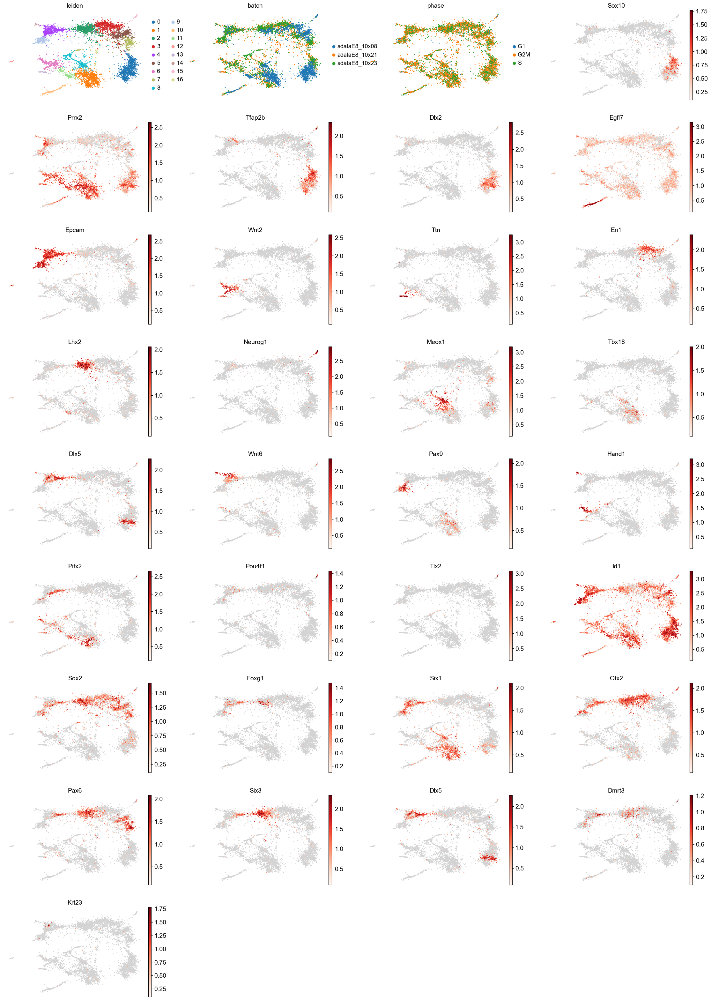

In [492]:
#adata_E8.obsm['X_scvi_MDE'] = scvi.model.utils.mde(adata_E8.obsm['X_scvi'])
#Keep cluster 0 for neural crest derived mesenchyme
sc.pl.embedding(
    adata_E8,
    basis='X_scvi_MDE',
    color=['leiden','batch','phase','Sox10','Prrx2','Tfap2b','Dlx2',
           'Egfl7', #Endothelial
           'Epcam', #ectoderm
           'Wnt2', #heart stuff
           'Ttn', #muscle
           'En1', #brain stuff
           'Lhx2', #prospective telencephalon
           'Neurog1',
           'Meox1', #somite
           'Tbx18', #mesoderm
           'Dlx5', 'Wnt6', #placode
           'Pax9', #different ecto
           'Hand1',
           'Pitx2',
           'Pou4f1',
           'Tlx2',
           'Id1',
           'Sox2',
           'Foxg1','Six1','Otx2','Pax6','Six3','Dlx5','Dmrt3','Krt23',
          ],
    #groups='17',
    frameon=False,
    ncols=4,
    cmap = reds,
    vmin=0.1,
)

In [341]:
adata_E8_mesen = adata_E8[adata_E8.obs['leiden'].isin([
    '0',
    #'4',
])].copy() #subset mesenchyme

In [342]:
adata_E8_mesen = subset_by_cluster_and_gene(adata = adata_E8_mesen, #dlx5 is expressed in the earliest delaminating neural crest. adataE8_10x08 is a late e8.5 and any dlx5 expression here is from the pharyngeal arches
                                            gene_name = 'Dlx5',
                                            expression_cutoff = 0,
                                            groupby = 'batch',
                                            group = 'adataE8_10x08',
                                           )
adata_E8_mesen = adata_E8_mesen[(adata_E8_mesen[:,'Hoxb2'].layers['original_counts']<1), : ].copy() #remove cells expressing hoxb2
adata_E8_mesen = adata_E8_mesen[(adata_E8_mesen[:,'Hand2'].layers['original_counts']<1), : ].copy() #remove cells expressing hand2, mandible

#adata_E8_mesen = adata_E8_mesen[(adata_E8_mesen[:,'Dlx5'].layers['original_counts']<2), : ].copy() #remove cells expressing 

2024-02-03 12:43:18,434 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


1706960598.2681882: PCA


2024-02-03 12:43:18,499 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-02-03 12:43:18,501 - harmonypy - INFO - Iteration 1 of 10
2024-02-03 12:43:18,552 - harmonypy - INFO - Iteration 2 of 10
2024-02-03 12:43:18,603 - harmonypy - INFO - Converged after 2 iterations
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


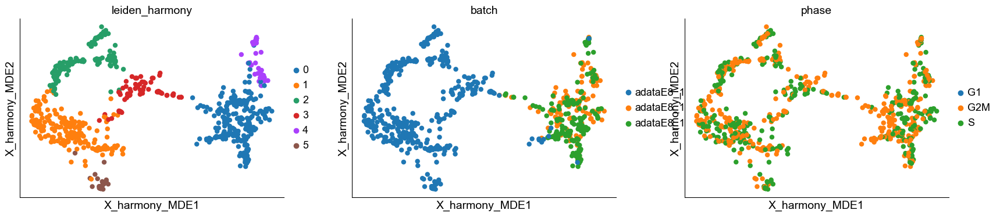

In [414]:
harmony_regress_integrate_pipe(adata_E8_mesen, n_comps =7, resolution = 0.4, random_state = 666, skip_preprocess = True)

In [420]:
#renaming clusters coarse
adata_E8_mesen.obs['E8_mesen_annotation_coarse'] = adata_E8_mesen.obs['leiden_harmony'] #create new column
adata_E8_mesen.obs['E8_mesen_annotation_coarse'] = adata_E8_mesen.obs['E8_mesen_annotation_coarse'].cat.add_categories(['Neural Crest',
                                                                                                                        'Frontonasal Mesenchyme',
                                                                                                                        'Maxillary Mesenchyme',])#add category names

adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '0'].obs.index,'E8_mesen_annotation_coarse'] = 'Neural Crest' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '4'].obs.index,'E8_mesen_annotation_coarse'] = 'Neural Crest' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '3'].obs.index,'E8_mesen_annotation_coarse'] = 'Neural Crest' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '2'].obs.index,'E8_mesen_annotation_coarse'] = 'Frontonasal Mesenchyme' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '1'].obs.index,'E8_mesen_annotation_coarse'] = 'Maxillary Mesenchyme' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '5'].obs.index,'E8_mesen_annotation_coarse'] = 'Maxillary Mesenchyme' 
adata_E8_mesen.obs['E8_mesen_annotation_coarse'] = adata_E8_mesen.obs['E8_mesen_annotation_coarse'].cat.remove_unused_categories() #remove unused categories

In [422]:
#renaming clusters fine
adata_E8_mesen.obs['E8_mesen_annotation_fine'] = adata_E8_mesen.obs['leiden_harmony'] #create new column
adata_E8_mesen.obs['E8_mesen_annotation_fine'] = adata_E8_mesen.obs['E8_mesen_annotation_fine'].cat.add_categories(['Delaminating Neural Crest',
                                                                                                                        'Migrating Neural Crest',
                                                                                                                        'Frontonasal Mesenchyme',
                                                                                                                        'Maxillary Mesenchyme',
                                                                                                                        'Id1- Dlx2+ glia?'
                                                                                                                       ])#add category names

adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '4'].obs.index,'E8_mesen_annotation_fine'] = 'Delaminating Neural Crest' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '0'].obs.index,'E8_mesen_annotation_fine'] = 'Migrating Neural Crest' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '3'].obs.index,'E8_mesen_annotation_fine'] = 'Migrating Neural Crest' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '2'].obs.index,'E8_mesen_annotation_fine'] = 'Frontonasal Mesenchyme' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '1'].obs.index,'E8_mesen_annotation_fine'] = 'Maxillary Mesenchyme' 
adata_E8_mesen.obs.loc[adata_E8_mesen[adata_E8_mesen.obs['leiden_harmony'] == '5'].obs.index,'E8_mesen_annotation_fine'] = 'Id1- Dlx2+ glia?' 
adata_E8_mesen.obs['E8_mesen_annotation_fine'] = adata_E8_mesen.obs['E8_mesen_annotation_fine'].cat.remove_unused_categories() #remove unused categories

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


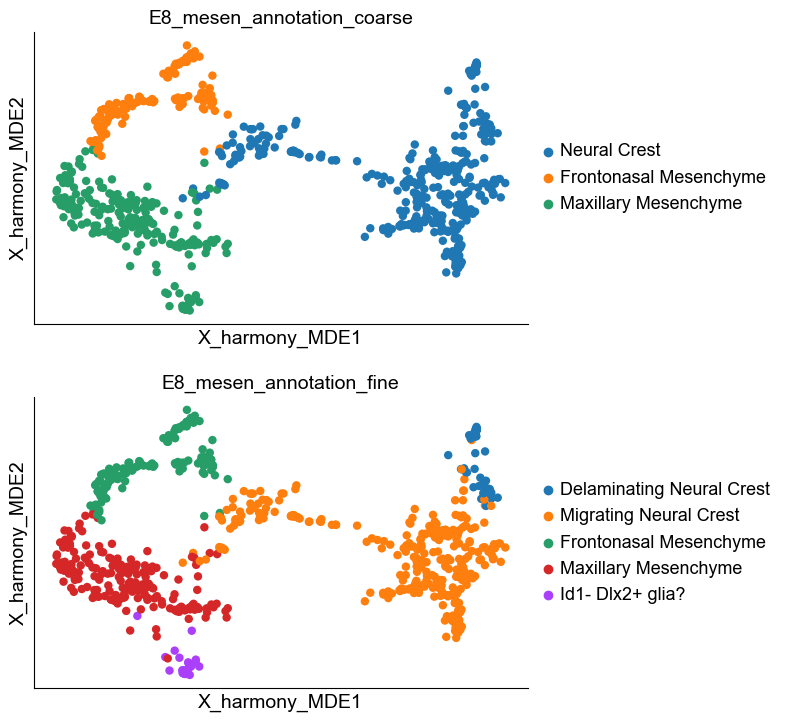

In [5]:
sc.pl.embedding(adata_E8_mesen,
                basis='X_harmony_MDE',
                color = ['E8_mesen_annotation_coarse',
                         'E8_mesen_annotation_fine',
                        ],
           ncols=1, cmap=reds, vmin=0.3)

In [5]:
adata_E8_mesen.X = adata_E8_mesen.layers['original_counts'].copy()
sc.pp.normalize_total(adata_E8_mesen, target_sum=1e4)
sc.pp.log1p(adata_E8_mesen)


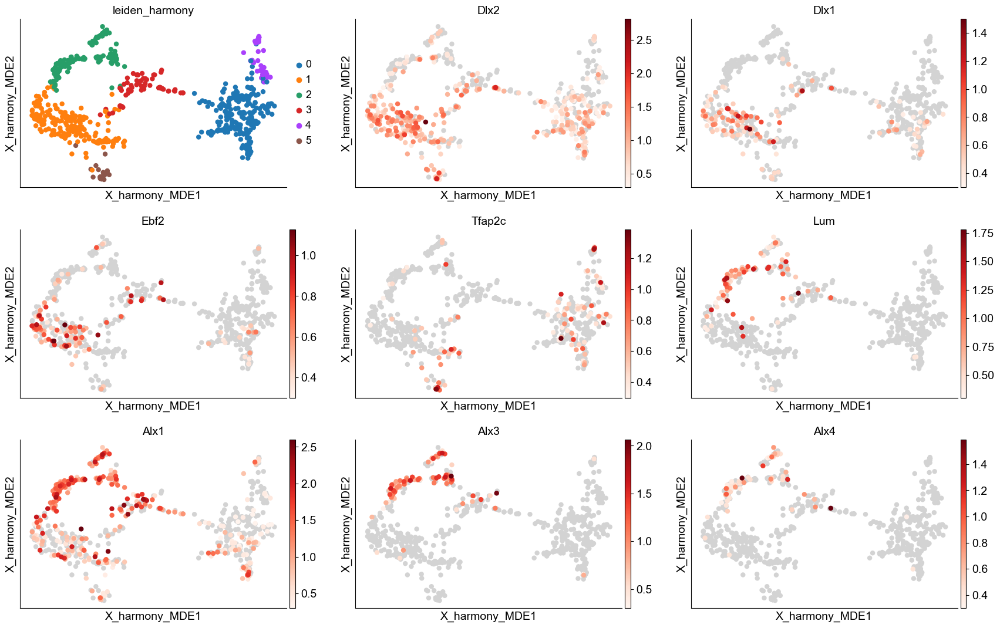

In [18]:
sc.pl.embedding(adata_E8_mesen,
                basis='X_harmony_MDE',
                color = ['leiden_harmony','Dlx2','Dlx1','Ebf2','Tfap2c','Lum','Alx1','Alx3','Alx4'],
           ncols=3, cmap=reds, vmin=0.3)

In [71]:
adata = adata_E8_mesen.copy()
adata.X = adata.layers['original_counts'].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

with open('allTFs_mm.txt') as f:
    tf_list = [line.rstrip('\n') for line in f]
import numpy as np
adata.var['TF'] = np.where(adata.var.index.isin(tf_list),True,False)
adata = adata[:,adata.var['TF']==True].copy()

sc.pp.highly_variable_genes(adata, min_disp = 0.5,batch_key='batch',
                            #n_top_genes=1000
                           )
adata.var['highly_variable'].value_counts()

highly_variable
False    1530
True      166
Name: count, dtype: int64

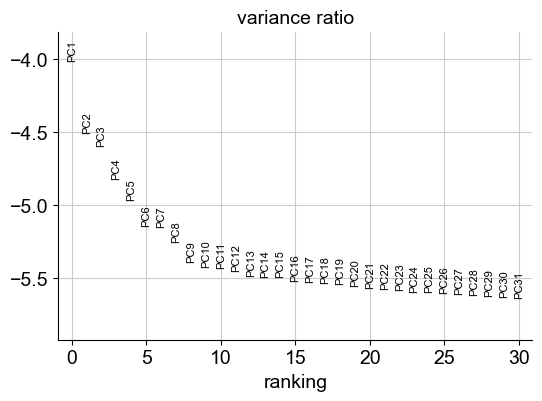

In [58]:


sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
sc.pp.highly_variable_genes(adata, min_disp = 0.6, batch_key = 'batch',#subset = True
                           )

adata.var.loc['Xist', "highly_variable"] = False
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log = True)

In [60]:
#rep_key = 'harmony_pca'
#sc.external.pp.harmony_integrate(adata,key = 'batch', adjusted_basis  = rep_key)
sc.pp.neighbors(adata, n_neighbors = 10, n_pcs = 6, #use_rep = rep_key
               )
sc.tl.umap(adata, min_dist=0.4, negative_sample_rate=8, random_state=909
          )
sc.tl.leiden(adata,resolution = 0.8)

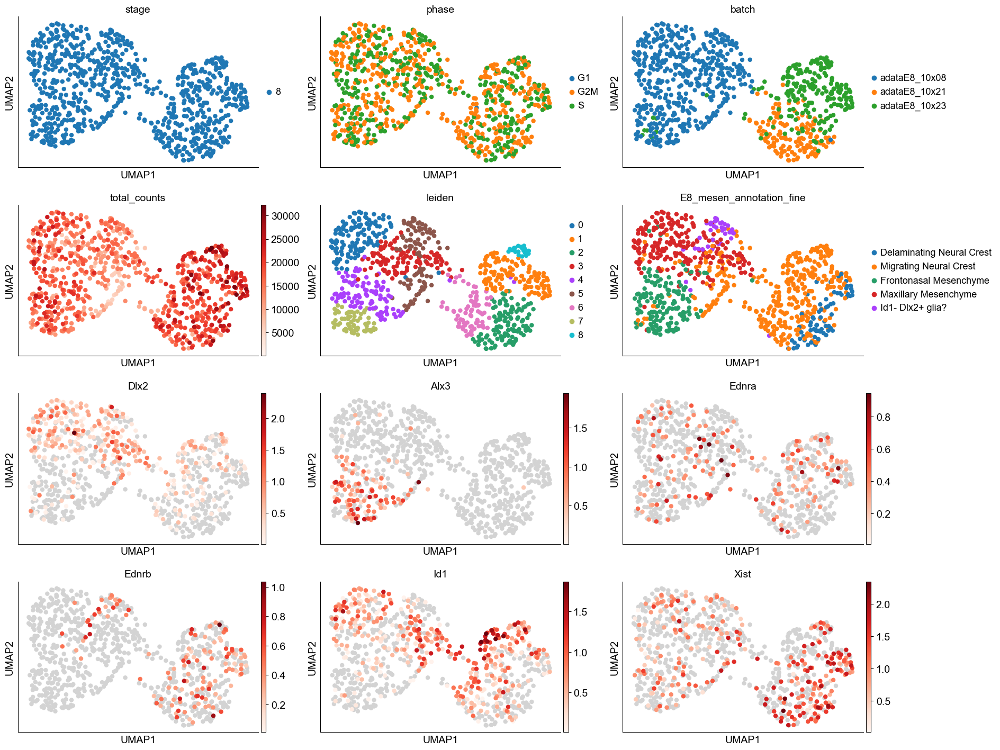

In [65]:
obs_var = ['stage','phase', 'batch','total_counts','leiden','E8_mesen_annotation_fine',]
genes = ['Dlx2','Alx3','Ednra','Ednrb','Id1','Xist']
sc.pl.umap(adata,
           color = obs_var + genes,
           ncols = 3,
           cmap=reds, vmin=0.01,)

In [7]:
adata_E8_ecto = adata_E8[adata_E8.obs['leiden'].isin(['4',])].copy() #subset ecto

In [ ]:
sc.tl.umap(adata_E8_ecto)
sc.tl.leiden(adata_E8_ecto, resolution = 0.4, key_added = 'leiden_ecto')
sc.pl.embedding(adata_E8_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto','batch','Dlx5','Wnt6','Six3','Pax6','Hoxb2','Hoxa1','Nkx2-3','Nkx2-5','Nkx2-6','Tubb3','Pax3','Sox2',
           'Foxg1','Six1','Otx2','Pax6','Six3','Dlx5','Dmrt3','Ppp1r14a','Hesx1','Pitx2','Fgf8','Krt7','Sostdc1','Hapln1'],
           ncols=3, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


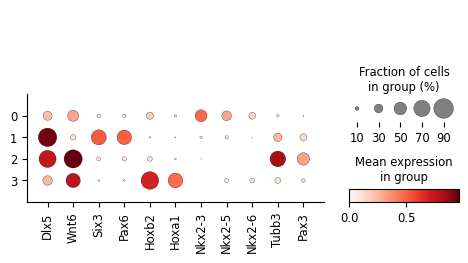

In [9]:
sc.pl.dotplot(adata_E8_ecto, var_names = ['Dlx5','Wnt6','Six3','Pax6','Hoxb2','Hoxa1','Nkx2-3','Nkx2-5','Nkx2-6','Tubb3','Pax3'], groupby = 'leiden_ecto')

In [11]:
#renaming clusters coarse
adata_E8_ecto.obs['E8_ecto_annotation_coarse'] = adata_E8_ecto.obs['leiden_ecto'] #create new column
adata_E8_ecto.obs['E8_ecto_annotation_coarse'] = adata_E8_ecto.obs['E8_ecto_annotation_coarse'].cat.add_categories(['endo','placode','ecto','cardiac'])#add category names

adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '0'].obs.index,'E8_ecto_annotation_coarse'] = 'endo' #Nkx2-3/5/6
adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '1'].obs.index,'E8_ecto_annotation_coarse'] = 'placode' #Dlx5 Six3 Pax6 Six6 Hesx1 Pitx2
adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '2'].obs.index,'E8_ecto_annotation_coarse'] = 'ecto' #Dlx5 Wnt6 Tubb3 Pax3
adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '3'].obs.index,'E8_ecto_annotation_coarse'] = 'cardiac' #Wnt6 Hoxb2 Hoxa1

#should remove Tbx1, Hoxb2, Hesx1, Pitx2, Nkx2-3/5/6
#Krt23

adata_E8_ecto.obs['E8_ecto_annotation_coarse'] = adata_E8_ecto.obs['E8_ecto_annotation_coarse'].cat.remove_unused_categories() #remove unused categories

In [ ]:
sc.pl.embedding(adata_E8_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto','batch','Epha1','Epha2','Epha3','Epha4','Epha5','Epha6','Epha7','Wnt6','Efna1','Efna2','Efna3','Efna4'],
           ncols=3, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


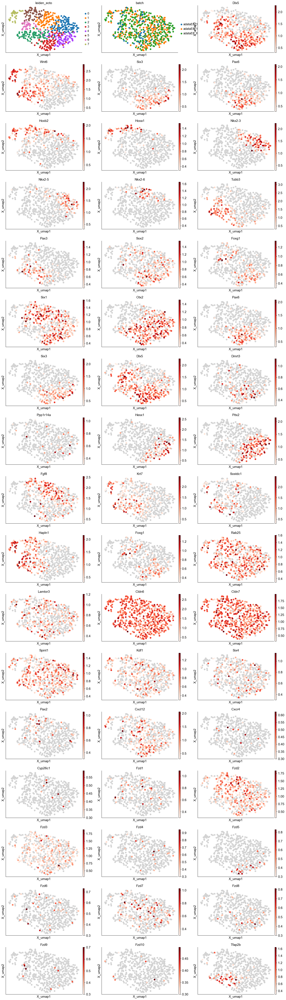

In [59]:
sc.tl.leiden(adata_E8_ecto, resolution = 1, key_added = 'leiden_ecto')
sc.pl.embedding(adata_E8_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto','batch','Dlx5','Wnt6','Six3','Pax6','Hoxb2','Hoxa1','Nkx2-3','Nkx2-5','Nkx2-6','Tubb3','Pax3','Sox2',
           'Foxg1','Six1','Otx2','Pax6','Six3','Dlx5','Dmrt3','Ppp1r14a','Hesx1','Pitx2','Fgf8','Krt7','Sostdc1','Hapln1','Foxg1','Rab25','Lamtor3','Cldn6','Cldn7','Spint1','Kdf1','Six4', 'Pax2',
                         'Cxcl12','Cxcr4','Cyp26c1','Fzd1','Fzd2','Fzd3','Fzd4','Fzd5','Fzd6','Fzd7','Fzd8','Fzd9','Fzd10','Tfap2b',
                        ],
           ncols=3, cmap=reds, vmin=0.3)

#remove 
    #Hoxb2/a1
    #Sox9/Krt23/Pax8
    #Nkx2-3
    #Nkx2-6
    #Nkx2-5
    #Hesx1

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


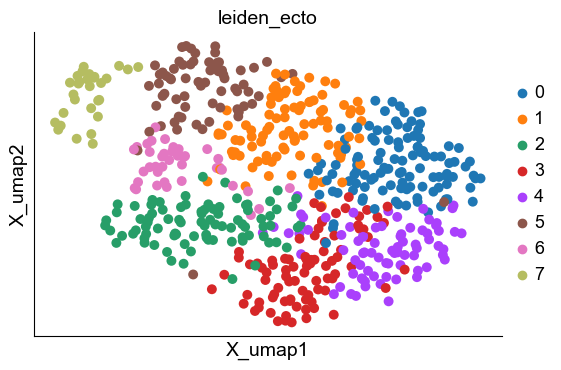

In [43]:
sc.pl.embedding(adata_E8_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto',
                        ],
           ncols=3, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


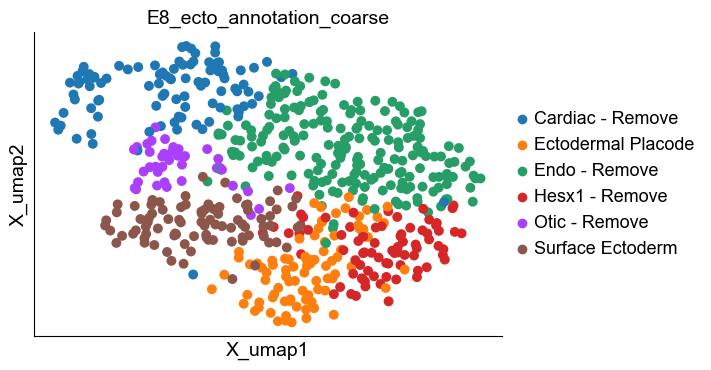

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


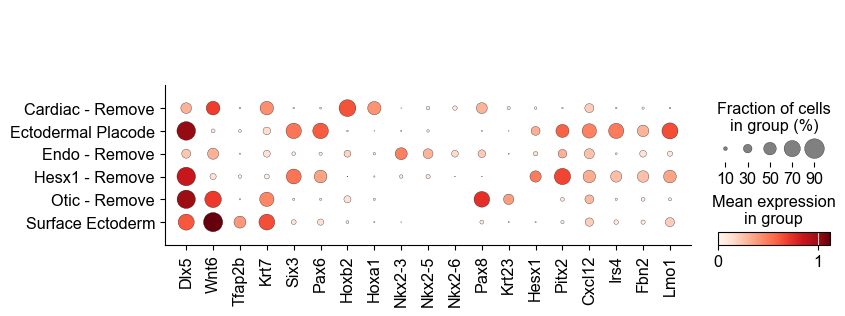

In [57]:
#renaming clusters coarse
adata_E8_ecto.obs['E8_ecto_annotation_coarse'] = 'tmp' #create new column

adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '0'].obs.index,'E8_ecto_annotation_coarse'] = 'Endo - Remove' #Nkx2-3/5/6
adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '1'].obs.index,'E8_ecto_annotation_coarse'] = 'Endo - Remove' #Nkx2-3/5/6

adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '3'].obs.index,'E8_ecto_annotation_coarse'] = 'Ectodermal Placode' #Dlx5 Six3 Pax6 Six6 Irs4 Fbn2 Cxcl12 Lmo1/3 Shisa2 Cdkn1c Ermn
adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '2'].obs.index,'E8_ecto_annotation_coarse'] = 'Surface Ectoderm' #Dlx5 Wnt6 Tubb3 Pax3 Krt7 Tfap2b Bmp2

adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '4'].obs.index,'E8_ecto_annotation_coarse'] = 'Hesx1 - Remove' #Hesx1 Pitx1/2

adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '6'].obs.index,'E8_ecto_annotation_coarse'] = 'Otic - Remove' #Krt23 Sox9 Pax8

adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '5'].obs.index,'E8_ecto_annotation_coarse'] = 'Cardiac - Remove' #Wnt6 Hoxb2 Hoxa1
adata_E8_ecto.obs.loc[adata_E8_ecto[adata_E8_ecto.obs['leiden_ecto'] == '7'].obs.index,'E8_ecto_annotation_coarse'] = 'Cardiac - Remove' #Wnt6 Hoxb2 Hoxa1

adata_E8_ecto.obs['E8_ecto_annotation_coarse'] = adata_E8_ecto.obs['E8_ecto_annotation_coarse'].astype('category')

adata_E8_ecto.obs['E8_ecto_annotation_coarse'] = adata_E8_ecto.obs['E8_ecto_annotation_coarse'].cat.remove_unused_categories() #remove unused categories

sc.pl.embedding(adata_E8_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['E8_ecto_annotation_coarse',
                        ],
           ncols=3, cmap=reds, vmin=0.3)

sc.pl.dotplot(adata_E8_ecto, 
              var_names = ['Dlx5','Wnt6','Tfap2b','Krt7','Six3','Pax6','Hoxb2','Hoxa1','Nkx2-3','Nkx2-5','Nkx2-6','Pax8','Krt23','Hesx1','Pitx2','Cxcl12','Irs4','Fbn2','Lmo1','Bmp2'], 
              groupby = 'E8_ecto_annotation_coarse')

In [58]:
#adata_E8_ecto.write('anndata_objects/adata_E8_ecto_annotated.h5ad')
adata_E8_ecto = sc.read('anndata_objects/adata_E8_ecto_annotated.h5ad')
